<a href="https://colab.research.google.com/drive/1VuIJm87OyP5ruISPHleLgG_9ngzNKYtb#scrollTo=VX3ULPLmeZ5I" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Midterm Examination (1/2565) Image processing



In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
from skimage import io
from skimage.util import img_as_ubyte
from google.colab.patches import cv2_imshow
import urllib.request

## Midterm examination

ให้นักศึกษาเขียนโปรแกรมเพื่อคัดแยกเม็ดยาทั้ง 5 ชนิดออกมาจากรูปที่ 1  โดยมีเกณฑ์การให้คะแนนดังนี้ <br>
1. โปรแกรมสามารถจัดการ noise ของภาพได้โดยสมบูรณ์(15 คะแนน) 

    a. สามารถจัดการกับ pattern noise ได้ (10 คะแนน) <br>
    b. สามารถจัดการกับ salt pepper noise ไดั (5 คะแนน) <br>

2. ทําการ segmentation ยาประเภทเดียวกัน แล้วนํามาแสดงผลบน 
    background ใหม่ โดยที่ยาแต่ละประเภท จะต้อง แสดงผลรวมอยู่ในลักษณะกลุ่ม
    (รูปที่ 2) โดยให้ใช้คําว่า Med ตามด้วยเลขชนิดยาและจํานวนยา (25 คะแนน) 

    a. สามารถแยกกลุ่มยาได้ (20 คะแนน) <br>
    b. สามารถนับจํานวนเม็ดยาแต่ละประเภทได้ (5 คะแนน) <br>

**รูปที่ 1 ภาพที่กำหนดให้**

<img align="left" width="400"  src="https://scontent.fbkk5-6.fna.fbcdn.net/v/t39.30808-6/311029277_633274768413035_7985280534533731591_n.jpg?_nc_cat=101&ccb=1-7&_nc_sid=730e14&_nc_eui2=AeFrcu6jg_Ik5Zh3cJ_PKVZzr4zjp-YKsemvjOOn5gqx6bv9e_omLBu1qzDkBxv0DlYCTsHKKBNivnKSrKvA0CV2&_nc_ohc=F7mEuIwzXR0AX9KvdfB&_nc_ht=scontent.fbkk5-6.fna&oh=00_AT_kp013cDzBnuk0NoYrkLlZ5W3NVVEEirj7hzWap8JUcQ&oe=634D32A6">

<br><br><br><br><br><br><br><br><br><br><br><br><br>
**รูปที่ 2 ภาพผลลัพธ์ที่ต้องการ**

<img align="left" width="400"  src="https://scontent.fbkk5-6.fna.fbcdn.net/v/t39.30808-6/311275774_633174245089754_5881313648091772455_n.jpg?_nc_cat=101&ccb=1-7&_nc_sid=730e14&_nc_eui2=AeH7CtibvOnb7CgCWiZgq2PL1B6cBm2L6uPUHpwGbYvq444oTEHPU80UNtemChc3meAaZVvQFVLCvaZaLflg8w_-&_nc_ohc=5-hfDFZOIf0AX-VmuOH&_nc_ht=scontent.fbkk5-6.fna&oh=00_AT_PKrmkcZOaZERVWOkUglqZ0Lblr5DUPo33qdsGUs-UXg&oe=634DA3C3">









Acual Size : (1013, 1348, 3)
New Size : (506, 674, 3)


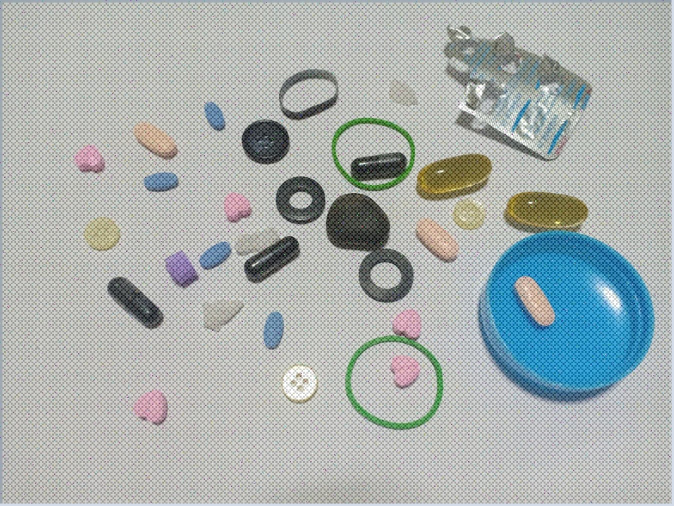

In [ ]:
url="https://lh5.googleusercontent.com/GtErcwU7fbgaktaxgDxcDJiCDqPKL0zqP4eCsVU4j669GJk1stHeo1D_P9yHrR4wbo_eNCXjp5UbmZQ=w2880-h1470"
url_medicine_with_noise= io.imread(url)
medicine_with_noise = img_as_ubyte(url_medicine_with_noise)
# IMG Resize -------------------------------------------------------------------
new_width  = int(medicine_with_noise.shape[1] * 0.5)
new_height = int(medicine_with_noise.shape[0] * 0.5)
#new_size 50% of img
new_size = (new_width, new_height)
# resize image
new_medicine_with_noise = cv2.resize(medicine_with_noise, new_size)
new_medicine_with_noise=cv2.cvtColor(new_medicine_with_noise,cv2.COLOR_BGR2RGB)
medicine_with_noise=cv2.cvtColor(medicine_with_noise,cv2.COLOR_BGR2RGB)
#-------------------------------------------------------------------------------
print("Acual Size :",medicine_with_noise.shape)
print("New Size :",new_medicine_with_noise.shape)
cv2_imshow(new_medicine_with_noise)

## 1.โปรแกรมสามารถจัดการ noise ของภาพได้โดยสมบูรณ์(15 คะแนน)
- สามารถจัดการกับ pattern noise ได้ (10 คะแนน) <br>
- สามารถจัดการกับ salt pepper noise ไดั (5 คะแนน) <br>





In [ ]:
medic_blur = cv2.blur(medicine_with_noise, (8,8))
medic_bilateral  = cv2.bilateralFilter(medic_blur, 15,15,15)
medic_bilateral2 = cv2.bilateralFilter(medic_bilateral, 20,20,20)
medic_bilateral3 = cv2.bilateralFilter(medic_bilateral2, 20,20,20)
#-- Sharp ----------------------------------------------------------------------
sharpKernel = np.array(([0, -1, 0],[-1, 5, -1],[0, -1, 0]), dtype="int")
medic_sharp = cv2.filter2D(medic_bilateral3, -1, sharpKernel) #use
# Compare Output and Image Name-------------------------------------------------
bilateral = np.hstack((medic_bilateral,medic_bilateral2,medic_bilateral3))
bilateral = cv2.putText(bilateral, 'bilateral' , (10,970)   , cv2.FONT_HERSHEY_SIMPLEX, 3, (0,0,0), 5, cv2.LINE_AA)
bilateral = cv2.putText(bilateral, 'bilateral2', (1358,970) , cv2.FONT_HERSHEY_SIMPLEX, 3, (0,0,0), 5, cv2.LINE_AA)
bilateral = cv2.putText(bilateral, 'bilateral3', (2703,970) , cv2.FONT_HERSHEY_SIMPLEX, 3, (0,0,0), 5, cv2.LINE_AA)
res = np.hstack((medicine_with_noise,medic_blur,medic_sharp))
res = cv2.putText(res, 'Original', (10,970)   , cv2.FONT_HERSHEY_SIMPLEX, 3, (0,0,0), 5, cv2.LINE_AA)
res = cv2.putText(res, 'Blur'    , (1358,970) , cv2.FONT_HERSHEY_SIMPLEX, 3, (0,0,0), 5, cv2.LINE_AA)
res = cv2.putText(res, 'Sharp'   , (2703,970) , cv2.FONT_HERSHEY_SIMPLEX, 3, (0,0,0), 5, cv2.LINE_AA)
# Show -------------------------------------------------------------------------
#dou = np.hstack((medic_blur,medic_sharp))
#cv2_imshow(dou)
#print("Tripple Size :",res.shape)
cv2_imshow(bilateral)
cv2_imshow(res)

Output hidden; open in https://colab.research.google.com to view.

## 2.ทําการ segmentation ยาประเภทเดียวกัน แล้วนํามาแสดงผลบน background ใหม่ 
โดยที่ยาแต่ละประเภท จะต้อง แสดงผลรวมอยู่ในลักษณะกลุ่ม (รูปที่ 2) โดยให้ใช้คําว่า Med ตามด้วยเลขชนิดยาและจํานวนยา (25 คะแนน)
- สามารถแยกกลุ่มยาได้ (20 คะแนน)
- สามารถนับจํานวนเม็ดยาแต่ละประเภทได้ (5 คะแนน) 

<br>

**รูปที่ 2 ภาพผลลัพธ์ที่ต้องการ**

<img width="400"  src="https://scontent.fbkk5-6.fna.fbcdn.net/v/t39.30808-6/311275774_633174245089754_5881313648091772455_n.jpg?_nc_cat=101&ccb=1-7&_nc_sid=730e14&_nc_eui2=AeH7CtibvOnb7CgCWiZgq2PL1B6cBm2L6uPUHpwGbYvq444oTEHPU80UNtemChc3meAaZVvQFVLCvaZaLflg8w_-&_nc_ohc=5-hfDFZOIf0AX-VmuOH&_nc_ht=scontent.fbkk5-6.fna&oh=00_AT_PKrmkcZOaZERVWOkUglqZ0Lblr5DUPo33qdsGUs-UXg&oe=634DA3C3">

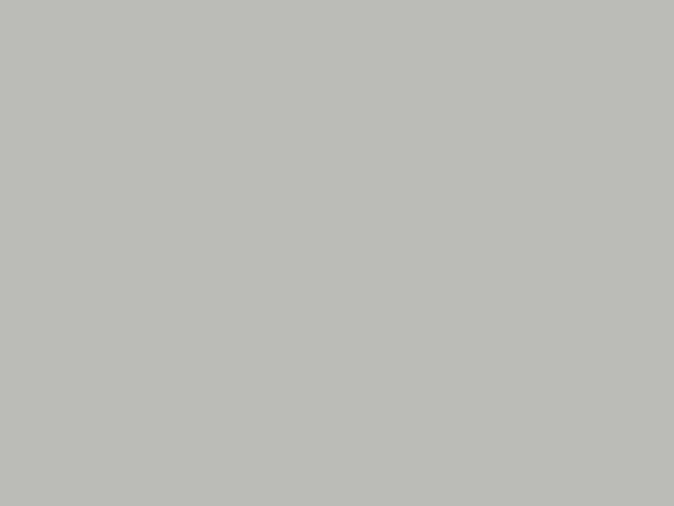

In [ ]:
# New Background----------------------------------------------------------------
height = 1013
width  = 1348
new_bg = np.zeros((height,width,3), np.uint8)
new_bg[:]=(183,188,187)
#-------------------------------------------------------------------------------
# For Show Only ----------------------------------------------------------------
# IMG Resize -------------------------------------------------------------------
new_width  = int(medicine_with_noise.shape[1] * 0.5)
new_height = int(medicine_with_noise.shape[0] * 0.5)
#new_size 50% of img -----------------------------------------------------------
bg_showsize = (new_width, new_height)
# resize image -----------------------------------------------------------------
new_bg_size = cv2.resize(new_bg, bg_showsize)
cv2_imshow(new_bg_size) #just for show

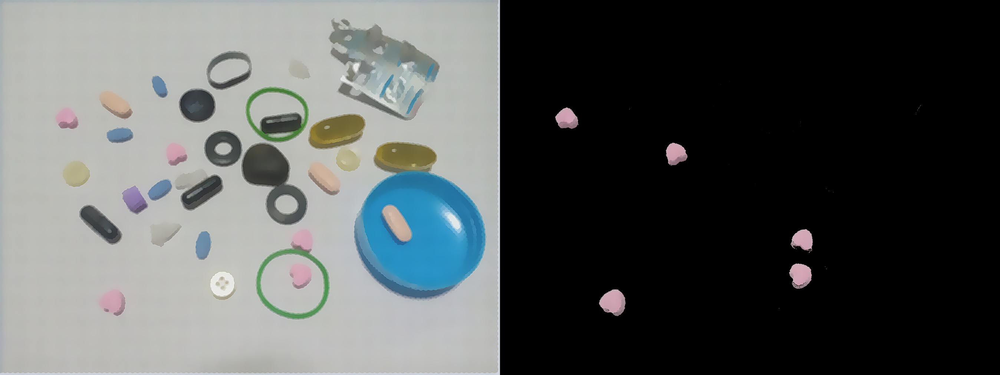

In [ ]:
#Pink Pill ---------------------------------------------------------------------
img_hsv = cv2.cvtColor(medic_sharp,cv2.COLOR_RGB2HSV)
#code here ---------------------------------------------------------------------
upper_range_pink=np.array([150,225,255]) # ค่าสูงสุดของ h,s และ v ที่ต้องการตรวจจับ
lower_range_pink=np.array([120,30,30]) # ค่าต่ำสุดของ h,s และ v ที่ต้องการตรวจจับ

mask = cv2.inRange(img_hsv,lower_range_pink,upper_range_pink) #สร้าง mask จากช่วง hsv ที่กำหนด

mask_indices=np.where(mask==255)  

pink_pill = np.zeros(medic_sharp.shape, dtype = "uint8")

pink_pill[mask_indices] = medic_sharp[mask_indices] 
pink_range=np.hstack((medic_sharp,pink_pill))
#-------------------------------------------------------------------------------
cv2_imshow(pink_range)

Med1 :  5 Tablet


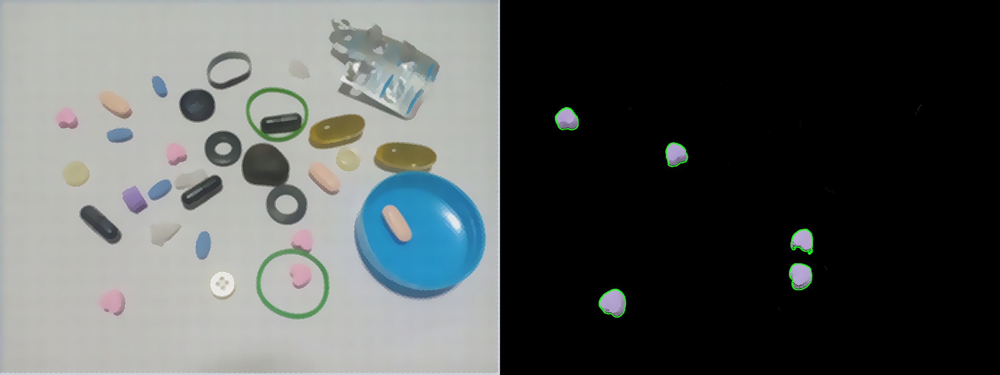

In [ ]:
#Pink Count --------------------------------------------------------------------
gray = cv2.cvtColor(pink_pill, cv2.COLOR_BGR2GRAY)
 
blur = cv2.GaussianBlur(gray, (11, 11), 0)
canny = cv2.Canny(blur, 30, 150, 3)
dilated = cv2.dilate(canny, (2, 2), iterations=3)
 
(pink_count, hierarchy) = cv2.findContours(
dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
rgb = cv2.cvtColor(pink_pill, cv2.COLOR_BGR2RGB)
cv2.drawContours(rgb, pink_count, -1, (0, 255, 0), 2)
respink = np.hstack((medic_sharp,rgb))
print("Med1 : ", len(pink_count) ,"Tablet")
cv2_imshow(respink)


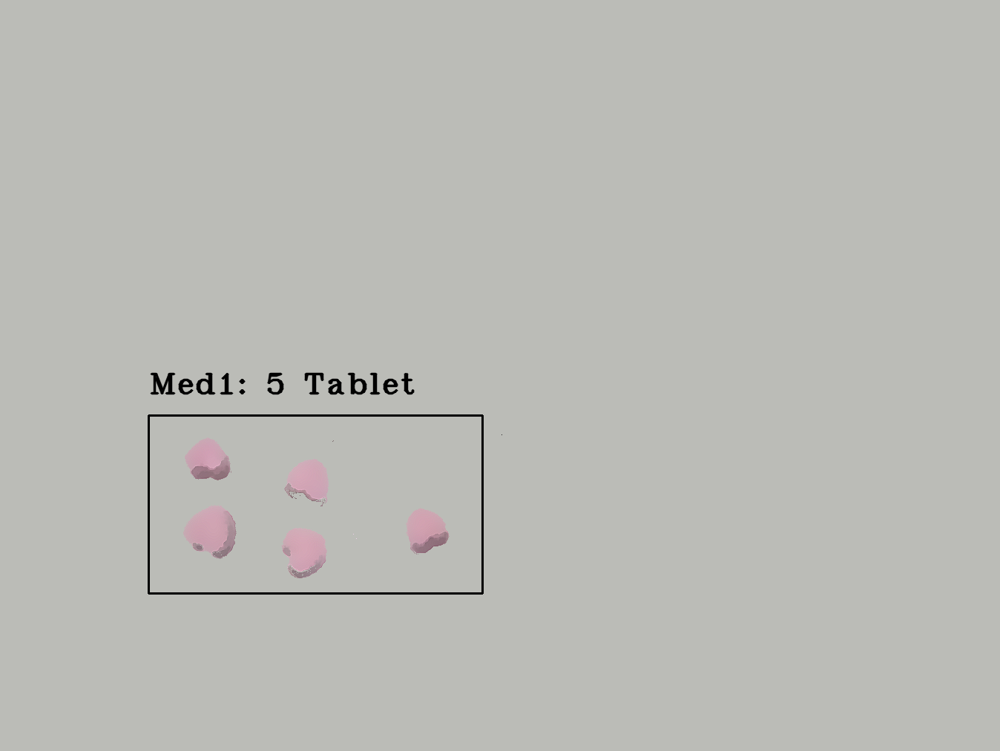

In [ ]:
#-------------------------------------------------------------------------------
#Pink1
#-------------------------------------------------------------------------------
pink1_graphcut = new_bg.copy()
# Pill Crop --------------------------------------------------------------------
P1_crop = pink_pill[500:800,500:1000]  #first lot
#-------------------------------------------------------------------------------
PM_gray = cv2.cvtColor(pink_pill,cv2.COLOR_BGR2GRAY)
PM_blur = cv2.GaussianBlur(PM_gray,(5,5),0)
mask = np.zeros(P1_crop.shape[:2],dtype=np.uint8)
#-------------------------------------------------------------------------------
# graphCut
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)
rect = (0,80,700,685) #Rect(left, top, width, height)
cv2.grabCut(P1_crop,mask,rect,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)

maskgraphcut = np.where((mask==2)|(mask==0),0,1).astype('uint8')
PM_img = P1_crop*maskgraphcut[:,:,np.newaxis]
maskgraphcut_indices = np.where(maskgraphcut==1)

pink1_graphcut[maskgraphcut_indices[0]+500,maskgraphcut_indices[1]+100] = P1_crop[maskgraphcut_indices]
#-------------------------------------------------------------------------------
# Pink2
#-------------------------------------------------------------------------------
pink2_graphcut = pink1_graphcut.copy()
# Pill Crop --------------------------------------------------------------------
P2_crop = pink_pill[200:500,100:600]   #secound lot
#-------------------------------------------------------------------------------
PM_gray = cv2.cvtColor(pink_pill,cv2.COLOR_BGR2GRAY)
PM_blur = cv2.GaussianBlur(PM_gray,(5,5),0)
mask = np.zeros(P2_crop.shape[:2],dtype=np.uint8)
#-------------------------------------------------------------------------------
# graphCut
fgdModel = np.zeros((1,65),np.float64)
rect = (0,80,700,600) #Rect(left, top, width, height)
cv2.grabCut(P2_crop,mask,rect,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)

maskgraphcut = np.where((mask==2)|(mask==0),0,1).astype('uint8')
PM_img = P2_crop*maskgraphcut[:,:,np.newaxis]
maskgraphcut_indices = np.where(maskgraphcut==1)

pink2_graphcut[maskgraphcut_indices[0]+500,maskgraphcut_indices[1]+200] = P2_crop[maskgraphcut_indices]
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
# Pink3
#-------------------------------------------------------------------------------
pink3_graphcut = pink2_graphcut.copy()
# Pill Crop --------------------------------------------------------------------
P3_crop = pink_pill[500:1000,100:700]   #thrid lot
#-------------------------------------------------------------------------------
PM_gray = cv2.cvtColor(pink_pill,cv2.COLOR_BGR2GRAY)
PM_blur = cv2.GaussianBlur(PM_gray,(5,5),0)
mask = np.zeros(P3_crop.shape[:2],dtype=np.uint8)
#-------------------------------------------------------------------------------
# graphCut
fgdModel = np.zeros((1,65),np.float64)
rect = (0,80,700,685) #Rect(left, top, width, height)
cv2.grabCut(P3_crop,mask,rect,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)

maskgraphcut = np.where((mask==2)|(mask==0),0,1).astype('uint8')
PM_img = P3_crop*maskgraphcut[:,:,np.newaxis]
maskgraphcut_indices = np.where(maskgraphcut==1)

pink3_graphcut[maskgraphcut_indices[0]+400,maskgraphcut_indices[1]+80] = P3_crop[maskgraphcut_indices]
# Write and Name-----------------------------------------------------------------
start_point = (200,560) 
end_point = (650, 800)
# Blue color in BGR
color = (0, 0, 0)
# Line thickness of 2 px
thickness = 2
# Using cv2.rectangle() method
# Draw a rectangle with blue line borders of thickness of 2 px
pink_image = cv2.rectangle(pink3_graphcut, start_point, end_point, color, thickness)
pink_image = cv2.putText(pink_image, 'Med1: 5 Tablet', (200,530), cv2.FONT_HERSHEY_COMPLEX_SMALL, 2, (0,0,0), 2, cv2.LINE_AA)
#-------------------------------------------------------------------------------
cv2_imshow(pink_image)

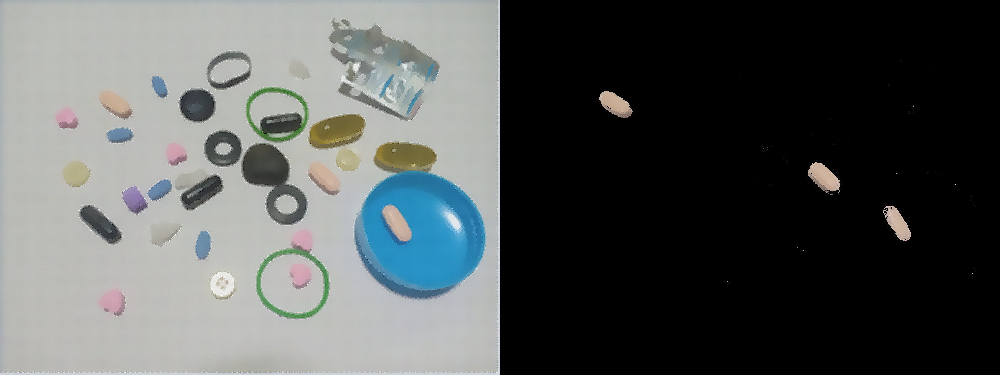

In [ ]:
#Orange Pill ---------------------------------------------------------------------
img_hsv = cv2.cvtColor(medic_sharp,cv2.COLOR_RGB2HSV)
#code here ---------------------------------------------------------------------
upper_range_orange=np.array([120,225,255]) # ค่าสูงสุดของ h,s และ v ที่ต้องการตรวจจับ
lower_range_orange=np.array([103,40,40]) # ค่าต่ำสุดของ h,s และ v ที่ต้องการตรวจจับ
mask = cv2.inRange(img_hsv,lower_range_orange,upper_range_orange) #สร้าง mask จากช่วง hsv ที่กำหนด
mask_indices=np.where(mask==255)  
orange_pill = np.zeros(medic_sharp.shape, dtype = "uint8")
orange_pill[mask_indices] = medic_sharp[mask_indices] 
orange_range=np.hstack((medic_sharp,orange_pill))
#-------------------------------------------------------------------------------
cv2_imshow(orange_range)
#cv2_imshow(O1_crop)

Med2 :  3 Tablet


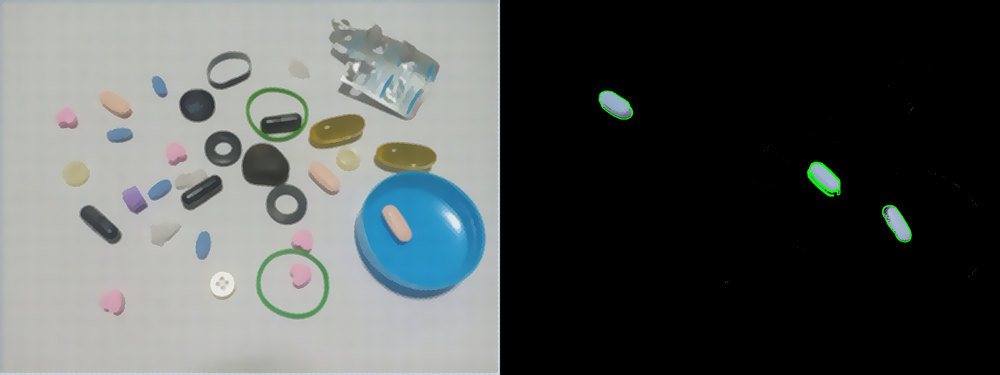

In [ ]:
#Orange Count --------------------------------------------------------------------
gray = cv2.cvtColor(orange_pill, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (11, 11), 0)
canny = cv2.Canny(blur, 30, 150, 3)
dilated = cv2.dilate(canny, (2, 2), iterations=3)
(org_count, hierarchy) = cv2.findContours(
dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
rgb = cv2.cvtColor(orange_pill, cv2.COLOR_BGR2RGB)
cv2.drawContours(rgb, org_count, -1, (0, 255, 0), 2)
resorg = np.hstack((medic_sharp,rgb))
print("Med2 : ", len(org_count) ,"Tablet")
cv2_imshow(resorg)

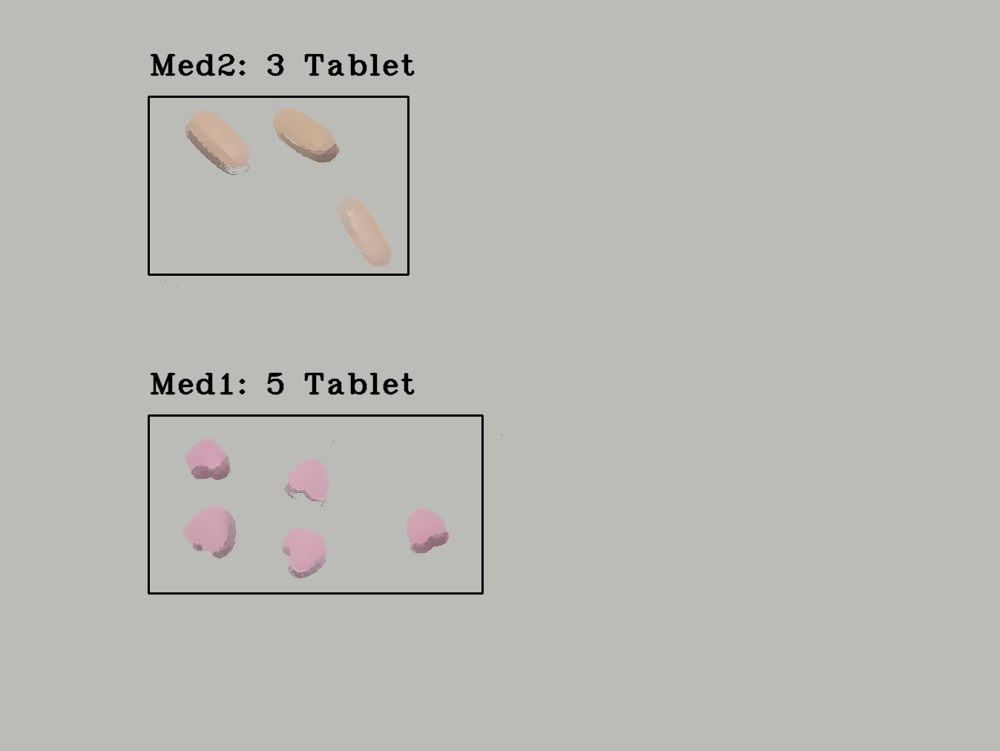

In [ ]:
#-------------------------------------------------------------------------------
#Orange
#-------------------------------------------------------------------------------
orange_graphcut = orange_pill.copy()
# Pill Crop --------------------------------------------------------------------
O1_crop = orange_pill[200:800,700:1350]   #first lot
#-------------------------------------------------------------------------------
PM_gray = cv2.cvtColor(pink_pill,cv2.COLOR_BGR2GRAY)
PM_blur = cv2.GaussianBlur(PM_gray,(5,5),0)
mask = np.zeros(O1_crop.shape[:2],dtype=np.uint8)
#-------------------------------------------------------------------------------
# graphCut
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)
rect = (0,100,900,600) #Rect(left, top, width, height)
cv2.grabCut(O1_crop,mask,rect,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)

maskgraphcut = np.where((mask==2)|(mask==0),0,1).astype('uint8')
PM_img = O1_crop*maskgraphcut[:,:,np.newaxis]
maskgraphcut_indices = np.where(maskgraphcut==1)

orange_graphcut[maskgraphcut_indices[0]+10,maskgraphcut_indices[1]+20] = O1_crop[maskgraphcut_indices] ##
#-------------------------------------------------------------------------------
all_orange_graphcut = pink_image.copy()
O_crop = orange_graphcut[200:600,100:520]   #orange want
#-------------------------------------------------------------------------------
PM_gray = cv2.cvtColor(O_crop ,cv2.COLOR_BGR2GRAY)
PM_blur = cv2.GaussianBlur(PM_gray,(5,5),0)
mask = np.zeros(O_crop.shape[:2],dtype=np.uint8)
#-------------------------------------------------------------------------------
# graphCut
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)
rect = (0,30,700,685) #Rect(left, top, width, height)
cv2.grabCut(O_crop,mask,rect,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)

maskgraphcut = np.where((mask==2)|(mask==0),0,1).astype('uint8')
PM_img = O_crop*maskgraphcut[:,:,np.newaxis]
maskgraphcut_indices = np.where(maskgraphcut==1)

all_orange_graphcut[maskgraphcut_indices[0]+100,maskgraphcut_indices[1]+200] = O_crop[maskgraphcut_indices]
#-------------------------------------------------------------------------------
# Write and Name-----------------------------------------------------------------
start_point = (200,130) 
end_point = (550, 370)
# Blue color in BGR
color = (0, 0, 0)
# Line thickness of 2 px
thickness = 2
# Using cv2.rectangle() method
# Draw a rectangle with blue line borders of thickness of 2 px
orange_image = cv2.rectangle(all_orange_graphcut, start_point, end_point, color, thickness)
orange_image = cv2.putText(orange_image, 'Med2: 3 Tablet', (200,100), cv2.FONT_HERSHEY_COMPLEX_SMALL, 2, (0,0,0), 2, cv2.LINE_AA)
#-------------------------------------------------------------------------------
cv2_imshow(orange_image)
#cv2_imshow(O_crop)

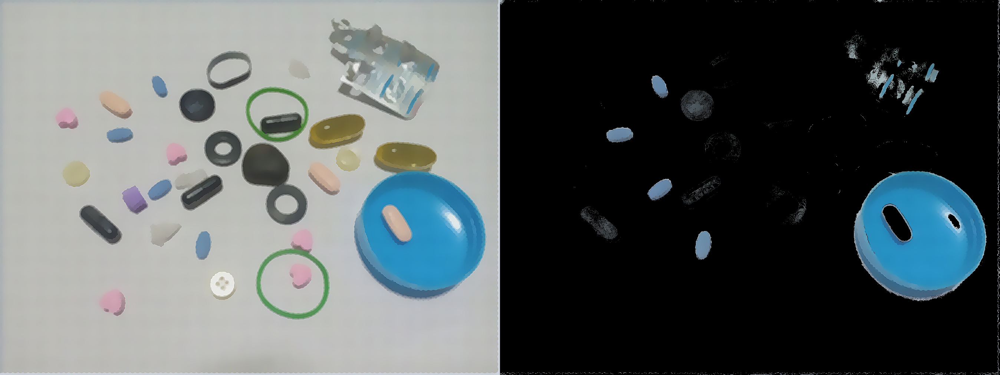

In [ ]:
#blue Pill ---------------------------------------------------------------------
img_hsv = cv2.cvtColor(medic_sharp,cv2.COLOR_RGB2HSV)

#code here ---------------------------------------------------------------------
upper_range_blue=np.array([30,225,255]) # ค่าสูงสุดของ h,s และ v ที่ต้องการตรวจจับ
lower_range_blue=np.array([10,20,20]) # ค่าต่ำสุดของ h,s และ v ที่ต้องการตรวจจับ

mask = cv2.inRange(img_hsv,lower_range_blue,upper_range_blue) #สร้าง mask จากช่วง hsv ที่กำหนด

mask_indices=np.where(mask==255)  

blue_pill = np.zeros(medic_sharp.shape, dtype = "uint8")

blue_pill[mask_indices] = medic_sharp[mask_indices] 

blue_range=np.hstack((medic_sharp,blue_pill))
#-------------------------------------------------------------------------------
cv2_imshow(blue_range)
#cv2_imshow(blue_pill)

In [ ]:
blue_graphcut = blue_pill.copy()
B1_crop = blue_pill[600:750,400:700]
#-------------------------------------------------------------------------------
PM_gray = cv2.cvtColor(pink_pill,cv2.COLOR_BGR2GRAY)
PM_blur = cv2.GaussianBlur(PM_gray,(5,5),0)
mask = np.zeros(B1_crop.shape[:2],dtype=np.uint8)
#-------------------------------------------------------------------------------
# graphCut
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)
rect = (0,10,700,685) #Rect(left, top, width, height)
cv2.grabCut(B1_crop,mask,rect,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)

maskgraphcut = np.where((mask==2)|(mask==0),0,1).astype('uint8')
PM_img = B1_crop*maskgraphcut[:,:,np.newaxis]
maskgraphcut_indices = np.where(maskgraphcut==1)

blue_graphcut[maskgraphcut_indices[0]+300,maskgraphcut_indices[1]+290] = B1_crop[maskgraphcut_indices]
#-------------------------------------------------------------------------------

Med2 :  4 Tablet


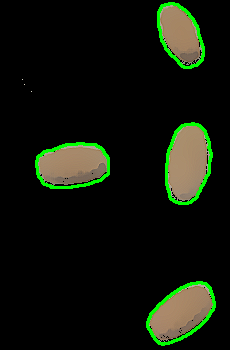

In [ ]:
# Blue Count -------------------------------------------------------------------
B_crop = blue_graphcut[200:550,250:480]
gray = cv2.cvtColor(B_crop, cv2.COLOR_BGR2GRAY)
 
blur = cv2.GaussianBlur(gray, (11, 11), 0)
canny = cv2.Canny(blur, 30, 150, 3)
dilated = cv2.dilate(canny, (2, 2), iterations=3)
 
(blue_count, hierarchy) = cv2.findContours(
dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
rgb = cv2.cvtColor(B_crop, cv2.COLOR_BGR2RGB)
cv2.drawContours(rgb, blue_count, -1, (0, 255, 0), 2)
#resorg = np.hstack((medic_sharp,rgb))
print("Med2 : ", len(blue_count) ,"Tablet")
cv2_imshow(rgb)

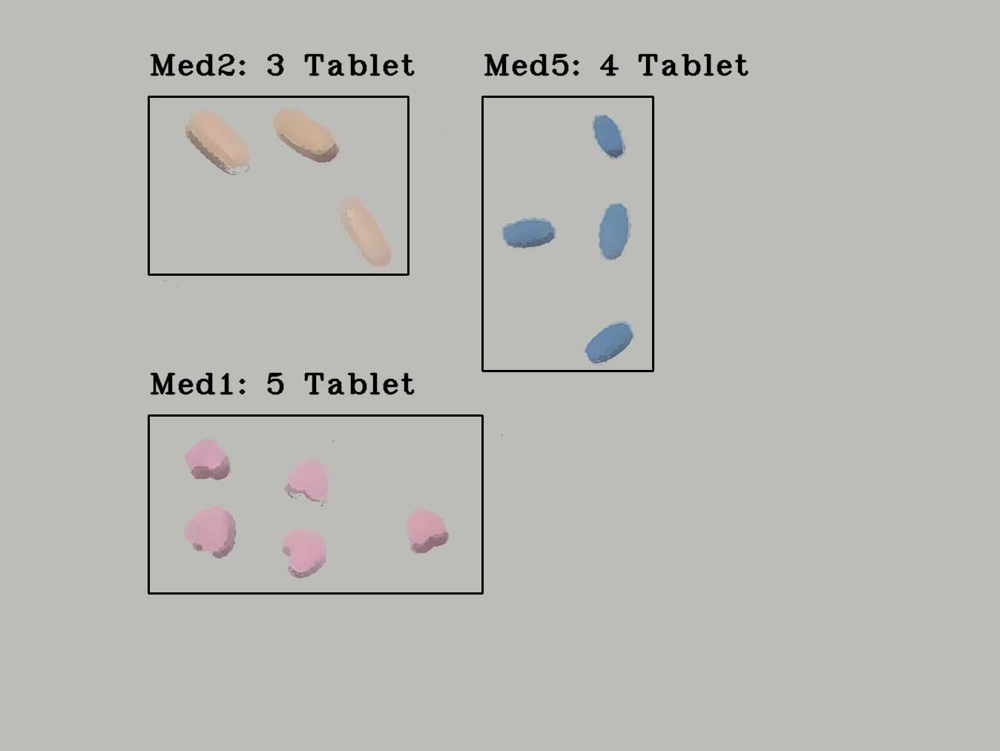

In [ ]:
#-------------------------------------------------------------------------------
all_blue_graphcut = orange_image.copy()
B_crop = blue_graphcut[200:550,250:480]
#-------------------------------------------------------------------------------
PM_gray = cv2.cvtColor(pink_pill,cv2.COLOR_BGR2GRAY)
PM_blur = cv2.GaussianBlur(PM_gray,(5,5),0)
mask = np.zeros(B_crop.shape[:2],dtype=np.uint8)
#-------------------------------------------------------------------------------
# graphCut
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)
rect = (0,5,700,685) #Rect(left, top, width, height)
cv2.grabCut(B_crop,mask,rect,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)

maskgraphcut = np.where((mask==2)|(mask==0),0,1).astype('uint8')
PM_img = B_crop*maskgraphcut[:,:,np.newaxis]
maskgraphcut_indices = np.where(maskgraphcut==1)

all_blue_graphcut[maskgraphcut_indices[0]+150,maskgraphcut_indices[1]+640] = B_crop[maskgraphcut_indices]
#-------------------------------------------------------------------------------
# Write and Name-----------------------------------------------------------------
start_point = (650,130) 
end_point = (880, 500)
# Blue color in BGR
color = (0, 0, 0)
# Line thickness of 2 px
thickness = 2
# Using cv2.rectangle() method
# Draw a rectangle with blue line borders of thickness of 2 px
blue_image = cv2.rectangle(all_blue_graphcut, start_point, end_point, color, thickness)
blue_image = cv2.putText(blue_image, 'Med5: 4 Tablet', (650,100), cv2.FONT_HERSHEY_COMPLEX_SMALL, 2, (0,0,0), 2, cv2.LINE_AA)
#-------------------------------------------------------------------------------
cv2_imshow(all_blue_graphcut)

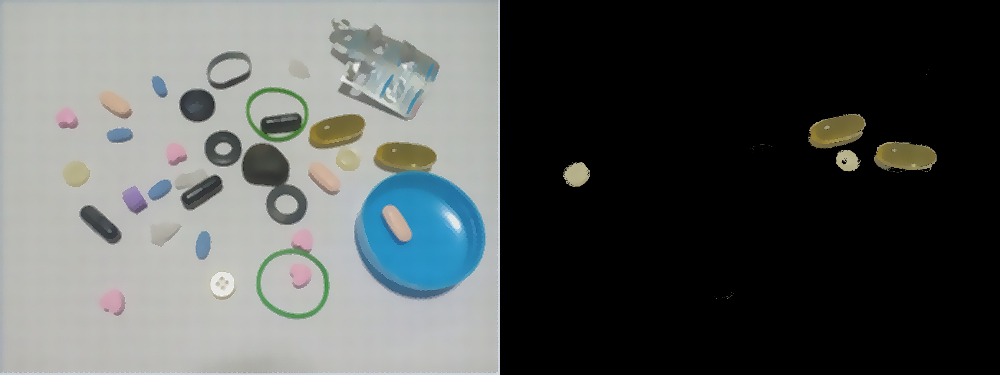

In [ ]:
#yellow Pill ---------------------------------------------------------------------
img_hsv = cv2.cvtColor(medic_sharp,cv2.COLOR_RGB2HSV)

#code here ---------------------------------------------------------------------
upper_range_yellow=np.array([100,225,255]) # ค่าสูงสุดของ h,s และ v ที่ต้องการตรวจจับ
lower_range_yellow=np.array([90,50,50]) # ค่าต่ำสุดของ h,s และ v ที่ต้องการตรวจจับ

mask = cv2.inRange(img_hsv,lower_range_yellow,upper_range_yellow) #สร้าง mask จากช่วง hsv ที่กำหนด

mask_indices=np.where(mask==255)  

yellow_pill = np.zeros(medic_sharp.shape, dtype = "uint8")

yellow_pill[mask_indices] = medic_sharp[mask_indices] 

yellow_range=np.hstack((medic_sharp,yellow_pill))
#-------------------------------------------------------------------------------
cv2_imshow(yellow_range)
#cv2_imshow(yellow_pill)

In [ ]:
yellow_graphcut = yellow_pill.copy()
Y1_crop = yellow_pill[300:550,1000:1200]
#-------------------------------------------------------------------------------
PM_gray = cv2.cvtColor(pink_pill,cv2.COLOR_BGR2GRAY)
PM_blur = cv2.GaussianBlur(PM_gray,(5,5),0)
mask = np.zeros(Y1_crop.shape[:2],dtype=np.uint8)
#-------------------------------------------------------------------------------
# graphCut
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)
rect = (0,10,700,685) #Rect(left, top, width, height)
cv2.grabCut(Y1_crop,mask,rect,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)

maskgraphcut = np.where((mask==2)|(mask==0),0,1).astype('uint8')
PM_img = Y1_crop*maskgraphcut[:,:,np.newaxis]
maskgraphcut_indices = np.where(maskgraphcut==1)

yellow_graphcut[maskgraphcut_indices[0]+200,maskgraphcut_indices[1]+700] = Y1_crop[maskgraphcut_indices]
#-------------------------------------------------------------------------------

Med2 :  2 Capsule


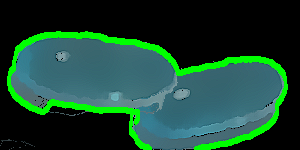

In [ ]:
#Y_crop = yellow_graphcut[300:550,800:1000]
# Yellow Count -------------------------------------------------------------------
Y_crop = yellow_graphcut[250:400,700:1000]
gray = cv2.cvtColor(Y_crop, cv2.COLOR_BGR2GRAY)
 
blur = cv2.GaussianBlur(gray, (11, 11), 0)
canny = cv2.Canny(blur, 30, 150, 3)
dilated = cv2.dilate(canny, (2, 2), iterations=3)
 
(yellow_count, hierarchy) = cv2.findContours(
dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
rgb = cv2.cvtColor(Y_crop, cv2.COLOR_BGR2RGB)
cv2.drawContours(rgb, yellow_count, -1, (0, 255, 0), 2)
#resorg = np.hstack((medic_sharp,rgb))
print("Med2 : ",len(yellow_count) ,"Capsule")
cv2_imshow(rgb)

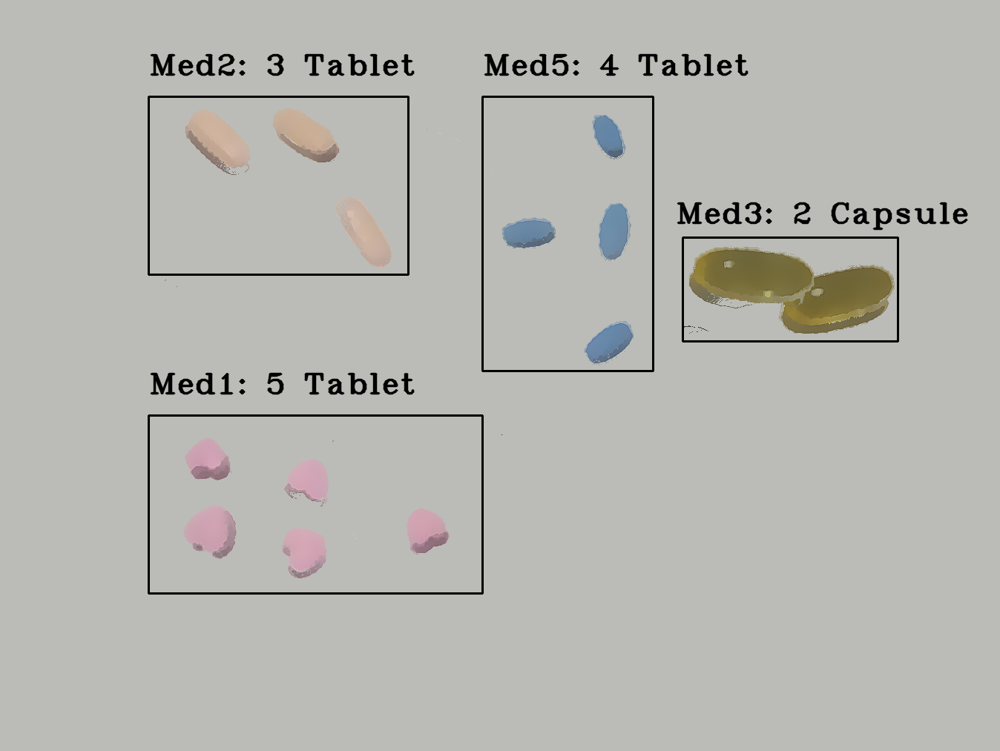

In [ ]:
#-------------------------------------------------------------------------------
all_yellow_graphcut = blue_image.copy()
Y_crop = yellow_graphcut[250:400,700:1000]
#-------------------------------------------------------------------------------
PM_gray = cv2.cvtColor(pink_pill,cv2.COLOR_BGR2GRAY)
PM_blur = cv2.GaussianBlur(PM_gray,(5,5),0)
mask = np.zeros(Y_crop.shape[:2],dtype=np.uint8)
#-------------------------------------------------------------------------------
# graphCut
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)
rect = (0,10,700,685) #Rect(left, top, width, height)
cv2.grabCut(Y_crop,mask,rect,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)

maskgraphcut = np.where((mask==2)|(mask==0),0,1).astype('uint8')
PM_img = Y_crop*maskgraphcut[:,:,np.newaxis]
maskgraphcut_indices = np.where(maskgraphcut==1)

all_yellow_graphcut[maskgraphcut_indices[0]+300,maskgraphcut_indices[1]+920] = Y_crop[maskgraphcut_indices]
#-------------------------------------------------------------------------------
# Write and Name----------------------------------------------------------------
start_point = (920,320) 
end_point = (1210, 460)
# Blue color in BGR
color = (0, 0, 0)
# Line thickness of 2 px
thickness = 2
# Using cv2.rectangle() method
# Draw a rectangle with blue line borders of thickness of 2 px
yellow_image = cv2.rectangle(all_yellow_graphcut, start_point, end_point, color, thickness)
yellow_image = cv2.putText(yellow_image, 'Med3: 2 Capsule', (910,300), cv2.FONT_HERSHEY_COMPLEX_SMALL, 2, (0,0,0), 2, cv2.LINE_AA)
#-------------------------------------------------------------------------------
cv2_imshow(all_yellow_graphcut)

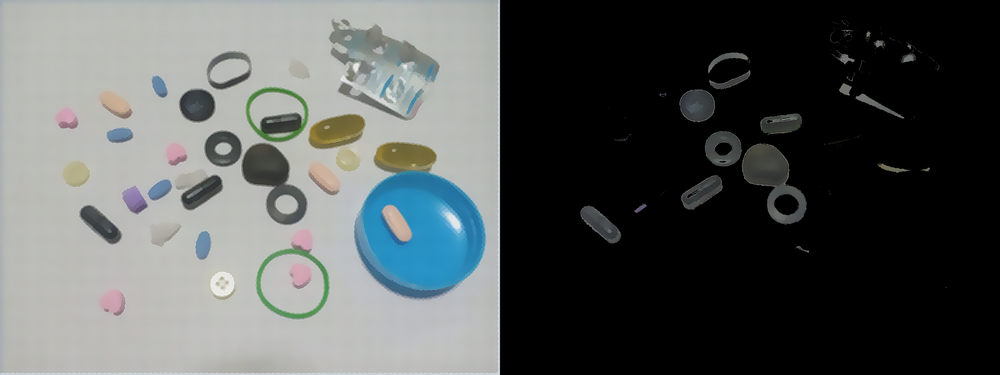

In [ ]:
#black Pill ---------------------------------------------------------------------
img_hsv = cv2.cvtColor(medic_sharp,cv2.COLOR_RGB2HSV)

#code here ---------------------------------------------------------------------
upper_range_black=np.array([255,80,120]) # ค่าสูงสุดของ h,s และ v ที่ต้องการตรวจจับ
lower_range_black=np.array([0,0,0]) # ค่าต่ำสุดของ h,s และ v ที่ต้องการตรวจจับ

mask = cv2.inRange(img_hsv,lower_range_black,upper_range_black) #สร้าง mask จากช่วง hsv ที่กำหนด

mask_indices=np.where(mask==255)  

black_pill = np.zeros(medic_sharp.shape, dtype = "uint8")

black_pill[mask_indices] = medic_sharp[mask_indices] 

black_range=np.hstack((medic_sharp,black_pill))
#-------------------------------------------------------------------------------
cv2_imshow(black_range)
#cv2_imshow(mask)

Med3 :  3 Capsule


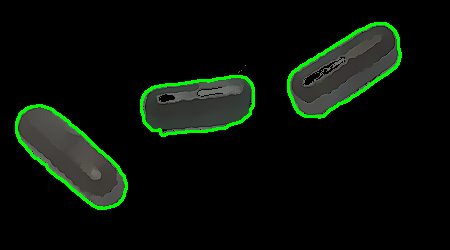

In [ ]:
BK_crop = black_pill[280:380,650:850]
black_graphcut = black_pill.copy()
#-------------------------------------------------------------------------------
PM_gray = cv2.cvtColor(pink_pill,cv2.COLOR_BGR2GRAY)
PM_blur = cv2.GaussianBlur(PM_gray,(5,5),0)
mask = np.zeros(BK_crop.shape[:2],dtype=np.uint8)
#-------------------------------------------------------------------------------
# graphCut
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)
rect = (0,10,700,685) #Rect(left, top, width, height)
cv2.grabCut(BK_crop,mask,rect,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)

maskgraphcut = np.where((mask==2)|(mask==0),0,1).astype('uint8')
PM_img = BK_crop*maskgraphcut[:,:,np.newaxis]
maskgraphcut_indices = np.where(maskgraphcut==1)

black_graphcut[maskgraphcut_indices[0]+500,maskgraphcut_indices[1]+290] = BK_crop[maskgraphcut_indices]
#-------------------------------------------------------------------------------
# Black Count -------------------------------------------------------------------
BLK_crop = black_graphcut[450:700,200:650]
gray = cv2.cvtColor(BLK_crop, cv2.COLOR_BGR2GRAY)
 
blur = cv2.GaussianBlur(gray, (11, 11), 0)
canny = cv2.Canny(blur, 30, 150, 3)
dilated = cv2.dilate(canny, (10, 10), iterations=1)
 
(black_count, hierarchy) = cv2.findContours(
dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
rgb = cv2.cvtColor(BLK_crop, cv2.COLOR_BGR2RGB)
cv2.drawContours(rgb, black_count, -1, (0, 255, 0), 2)
#resorg = np.hstack((medic_sharp,rgb))
print("Med4 : ",len(black_count) ,"Capsule")
cv2_imshow(rgb)
#cv2_imshow(BLK_crop)

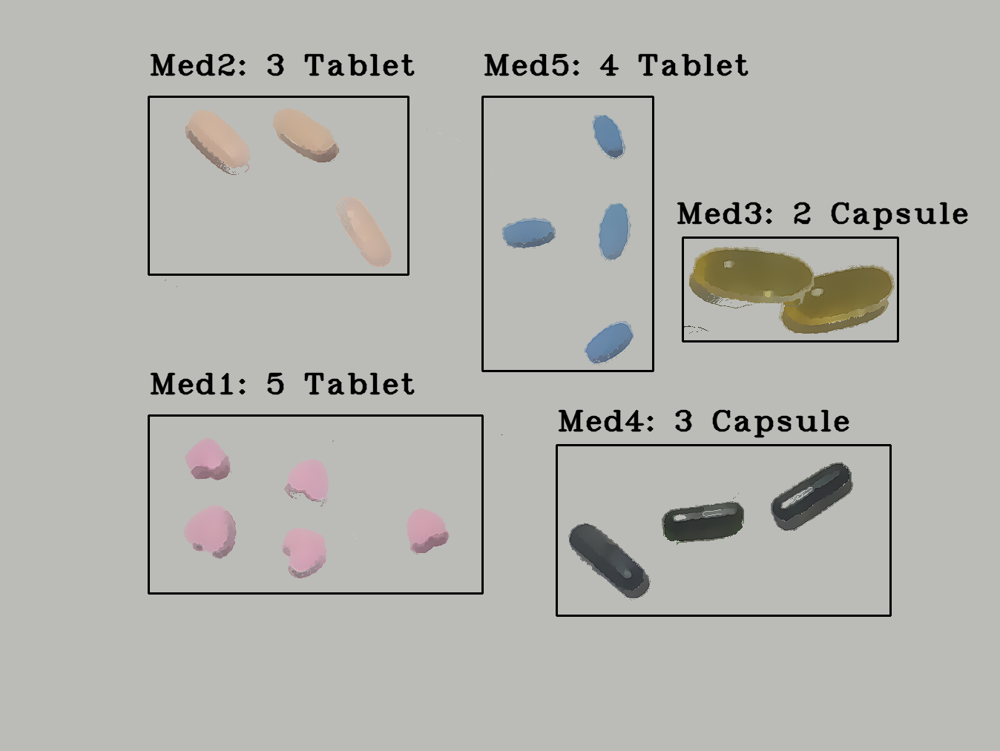

In [ ]:
#-------------------------------------------------------------------------------
all_black_graphcut = yellow_image.copy()
BLK_crop = black_graphcut[450:700,200:650]
#-------------------------------------------------------------------------------
PM_gray = cv2.cvtColor(pink_pill,cv2.COLOR_BGR2GRAY)
PM_blur = cv2.GaussianBlur(PM_gray,(5,5),0)
mask = np.zeros(BLK_crop.shape[:2],dtype=np.uint8)
#-------------------------------------------------------------------------------
# graphCut
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)
rect = (0,1,700,685) #Rect(left, top, width, height)
cv2.grabCut(BLK_crop,mask,rect,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)

maskgraphcut = np.where((mask==2)|(mask==0),0,1).astype('uint8')
PM_img = BLK_crop*maskgraphcut[:,:,np.newaxis]
maskgraphcut_indices = np.where(maskgraphcut==1)

all_black_graphcut[maskgraphcut_indices[0]+600,maskgraphcut_indices[1]+750] = BLK_crop[maskgraphcut_indices]
#-------------------------------------------------------------------------------
# Write and Name----------------------------------------------------------------
start_point = (750,830) 
end_point = (1200, 600)
# Blue color in BGR
color = (0, 0, 0)
# Line thickness of 2 px
thickness = 2
# Using cv2.rectangle() method
# Draw a rectangle with blue line borders of thickness of 2 px
black_image = cv2.rectangle(all_black_graphcut, start_point, end_point, color, thickness)
black_image = cv2.putText(black_image, 'Med4: 3 Capsule', (750,580), cv2.FONT_HERSHEY_COMPLEX_SMALL, 2, (0,0,0), 2, cv2.LINE_AA)
#-------------------------------------------------------------------------------
cv2_imshow(all_black_graphcut)

In [ ]:
# Finish (may be) --------------------------------------------------------------
fivepill = all_black_graphcut.copy()
outpill_img = np.hstack((medicine_with_noise,medic_sharp,fivepill))
# Put Name ---------------------------------------------------------------------
outpill_img = cv2.putText(outpill_img, 'Original'     , (20,970)   , cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0,0), 5, cv2.LINE_AA)
outpill_img = cv2.putText(outpill_img, 'Denoising'    , (1360,970) , cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0,0), 5, cv2.LINE_AA)
outpill_img = cv2.putText(outpill_img, 'Segmentation' , (2720,970) , cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0,0), 5, cv2.LINE_AA)
#-------------------------------------------------------------------------------
cv2_imshow(outpill_img)

Output hidden; open in https://colab.research.google.com to view.